In [129]:
import numpy as np
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 

plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'retina'

In [88]:
dir_name   =  "./DATA/"
file_name  =  "Annual_CHL_CMIP6_hist_Lat_6090.nc"
path_name  =  dir_name+file_name

f    = xr.open_dataset(path_name)

CHL = f.chl

dir_name   =  "./DATA/"
file_name  =  "Annual_NO3_CMIP6_hist_Lat_6090.nc"
path_name  =  dir_name+file_name

f    = xr.open_dataset(path_name)

NO3 = f.no3

dir_name   =  "./DATA/"
file_name  =  "Annual_vert_temp_CMIP6_hist_Lat_6090.nc"
path_name  =  dir_name+file_name

f    = xr.open_dataset(path_name)

temp = f.temp

dir_name   =  "./DATA/"
file_name  =  "Annual_SIC_CMIP6_hist_Lat_6090.nc"
path_name  =  dir_name+file_name

f    = xr.open_dataset(path_name)

SIC = f.siconc

In [130]:
weights_lat      = np.cos(np.deg2rad(f.lat))
weights_lat.name = "weights"     

In [121]:
CHL_MME  = CHL.mean("model_name")
NO3_MME  = NO3.mean("model_name")
temp_MME = temp.mean("model_name")
SIC_MME  = SIC.mean("model_name")

CHL_mean_time_MME  = CHL_MME.mean("year")
NO3_mean_time_MME  = NO3_MME.mean("year")
temp_mean_time_MME = temp_MME.mean("year")
SIC_mean_time_MME  = SIC_MME.mean("year")

In [164]:
CHL_diversity  = CHL.weighted(weights_lat).mean(("lat","lon"))
NO3_diversity  = NO3.weighted(weights_lat).mean(("lat","lon"))
SIC_diversity  = SIC.weighted(weights_lat).mean(("lat","lon"))
temp_diversity = temp.weighted(weights_lat).mean(("lat","lon"))

In [122]:
CHL_1D  = CHL_mean_time_MME.values.ravel()
NO3_1D  = NO3_mean_time_MME.values.ravel()
SIC_1D  = SIC_mean_time_MME.values.ravel()
temp_1D = temp_mean_time_MME[0,:,:].values.ravel()

In [23]:
ind_nnan = ~np.isnan(CHL_1D)

Text(0.5, 1.0, 'Chlorophyll Time Series')

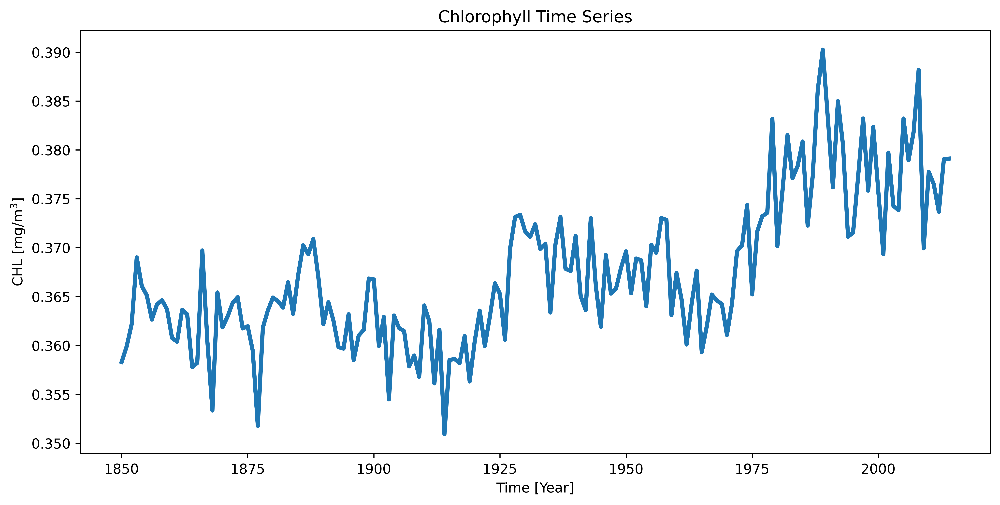

In [274]:
fig,axes = plt.subplots(1,1,figsize=(10,5),constrained_layout=True)

axes.plot(CHL_diversity.year.dt.year,CHL_diversity.mean("model_name"),
          linewidth=3,color='tab:blue',label='MME')

axes.set_xlabel("Time [Year]")
axes.set_ylabel("CHL [mg/m$^3$]")
axes.set_title("Chlorophyll Time Series")

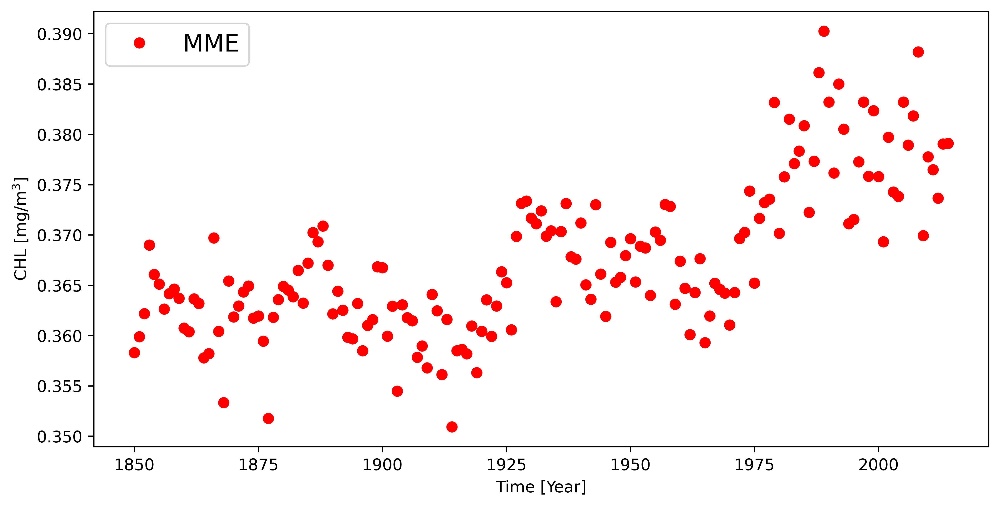

In [217]:
fig,axes = plt.subplots(1,1,figsize=(10,5),constrained_layout=True)

axes.plot(CHL_diversity.year.dt.year,CHL_diversity.mean("model_name"),'ro',label='MME')
axes.set_xlabel("Time [Year]")
axes.set_ylabel("CHL [mg/m$^3$]")
axes.legend(fontsize=15)

In [225]:
filled_markers = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
color_name     = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple',
                  'tab:brown','tab:pink','tab:gray','tab:olive','tab:cyan','k','r','b']

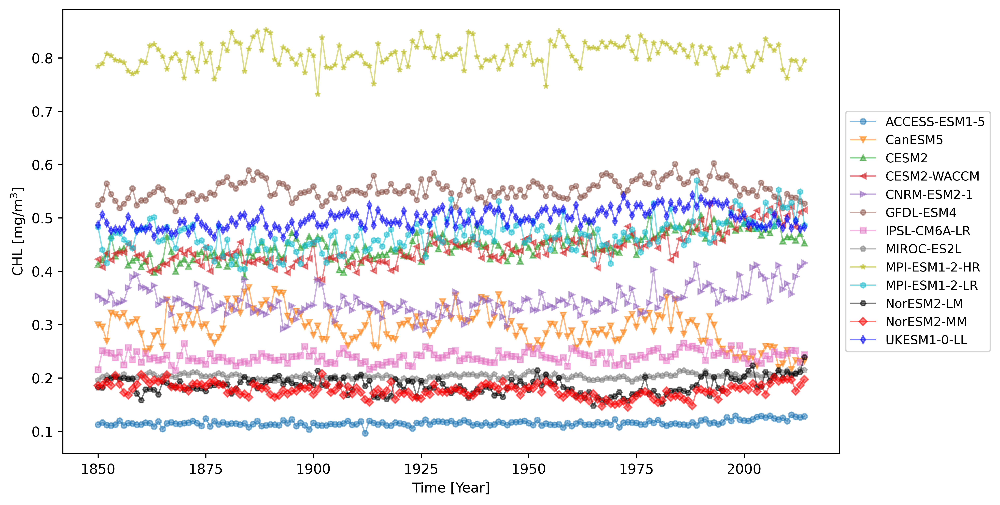

In [273]:
fig,axes = plt.subplots(1,1,figsize=(10,5),constrained_layout=True)

N_model  = len(CHL_diversity.model_name)

for it in range(N_model):
    axes.plot(CHL_diversity.year.dt.year,CHL_diversity[it,:],
              linewidth=1,alpha=0.5,markersize=4,
              color=color_name[it],marker=filled_markers[it],
              label=CHL_diversity.model_name[it].values)
    
axes.set_xlabel("Time [Year]")
axes.set_ylabel("CHL [mg/m$^3$]")    

axes.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=1,fontsize=9)

Text(0, 0.5, 'CHL [mg/m$^3$]')

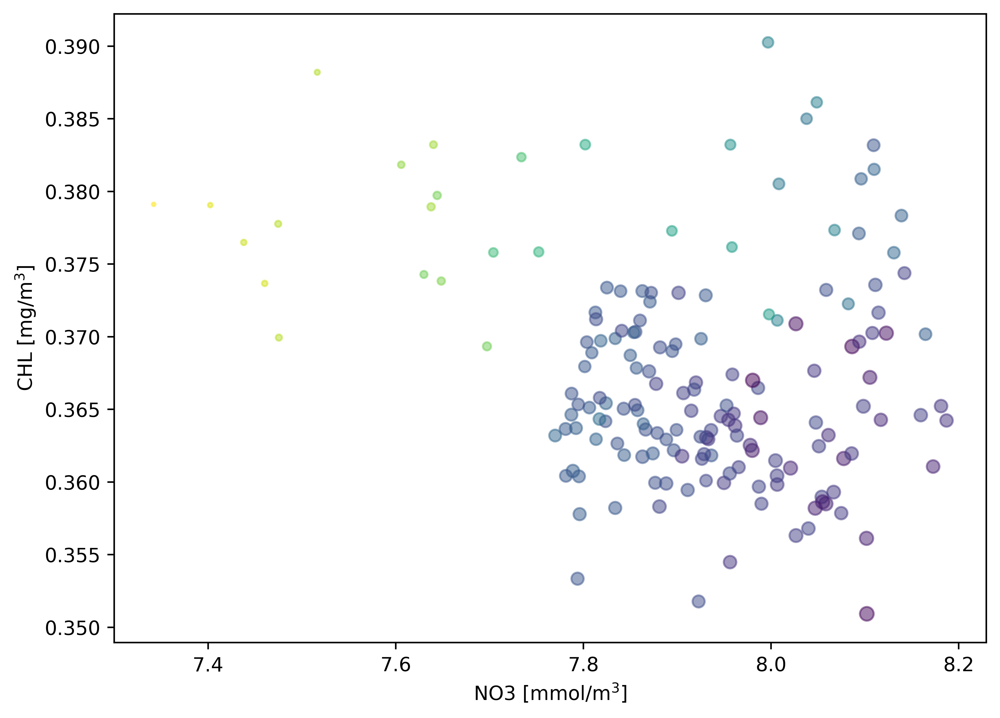

In [272]:
fig,axes = plt.subplots(1,1,figsize=(7,5),constrained_layout=True)

axes.scatter(NO3_diversity.mean("model_name"),
             CHL_diversity.mean("model_name"),
             c=temp_diversity[:,:,0].mean("model_name"),
             s=5*(SIC_diversity.mean("model_name")-52),alpha=0.5)

axes.set_xlabel("NO3 [mmol/m$^3$]")
axes.set_ylabel("CHL [mg/m$^3$]")  

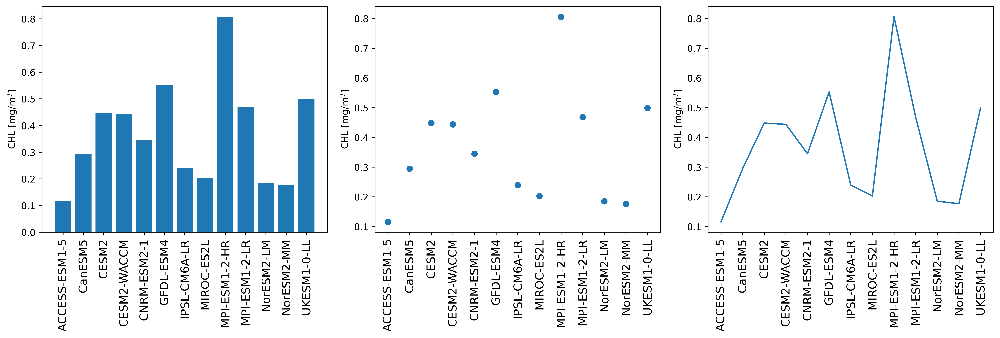

In [286]:
fig,axes = plt.subplots(1,3,figsize=(15,5),constrained_layout=True)

axes[0].bar(CHL_diversity.model_name.values,CHL_diversity.mean("year"))
axes[1].scatter(CHL_diversity.model_name.values,CHL_diversity.mean("year"))
axes[2].plot(CHL_diversity.model_name.values,CHL_diversity.mean("year"))

for it in range(3):
    axes[it].set_xticks(CHL_diversity.model_name.values)
    axes[it].set_xticklabels(CHL_diversity.model_name.values,
                             fontsize=12.5,rotation=90)
    axes[it].set_ylabel("CHL [mg/m$^3$]")

Text(0, 0.5, 'NO3 [mmol/m$^3$]')

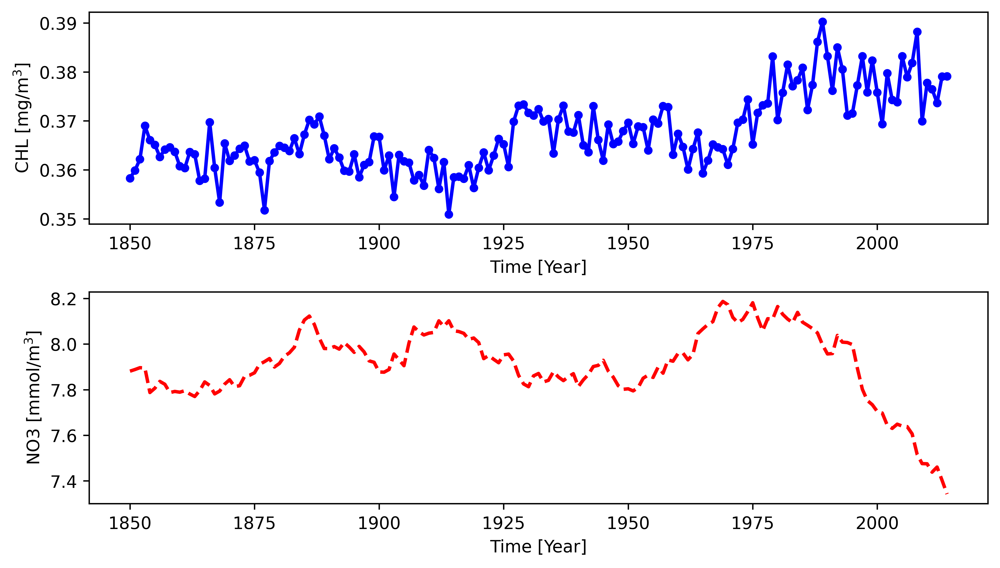

In [298]:
fig,axes = plt.subplots(2,1,figsize=(8,4.5),constrained_layout=True)

axes[0].plot(CHL_diversity.year.dt.year,CHL_diversity.mean("model_name"),
             'bo-',linewidth=2,markersize=4)
axes[1].plot(NO3_diversity.year.dt.year,NO3_diversity.mean("model_name"),
             'r--',linewidth=2)

axes[0].set_xlabel("Time [Year]") ; axes[0].set_ylabel("CHL [mg/m$^3$]")
axes[1].set_xlabel("Time [Year]") ; axes[1].set_ylabel("NO3 [mmol/m$^3$]")

Text(0.5, 1.0, 'Histogram of Arctic Chlorophyll Distribution')

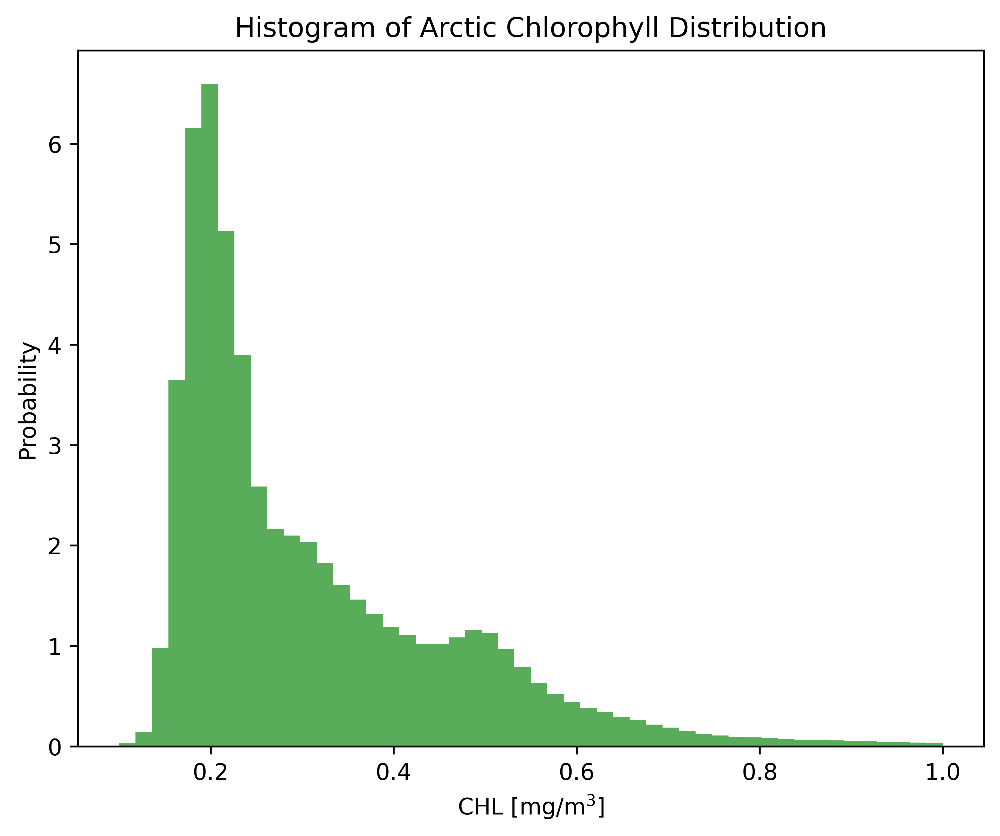

In [317]:
fig,axes = plt.subplots(1,1,figsize=(6,5),constrained_layout=True)

x = CHL_MME.values.ravel()
n, bins, patches = axes.hist(x, 50, density=1, range=(0.1,1.0),
                            facecolor='g', alpha=0.65)

axes.set_xlabel("CHL [mg/m$^3$]")
axes.set_ylabel("Probability")
axes.set_title("Histogram of Arctic Chlorophyll Distribution")

In [324]:
ind_max_CHL = np.argmax(CHL_diversity.mean("model_name"))
ind_min_CHL = np.argmin(CHL_diversity.mean("model_name"))

Text(0.5, 1.0, 'Chlorophyll Time Series')

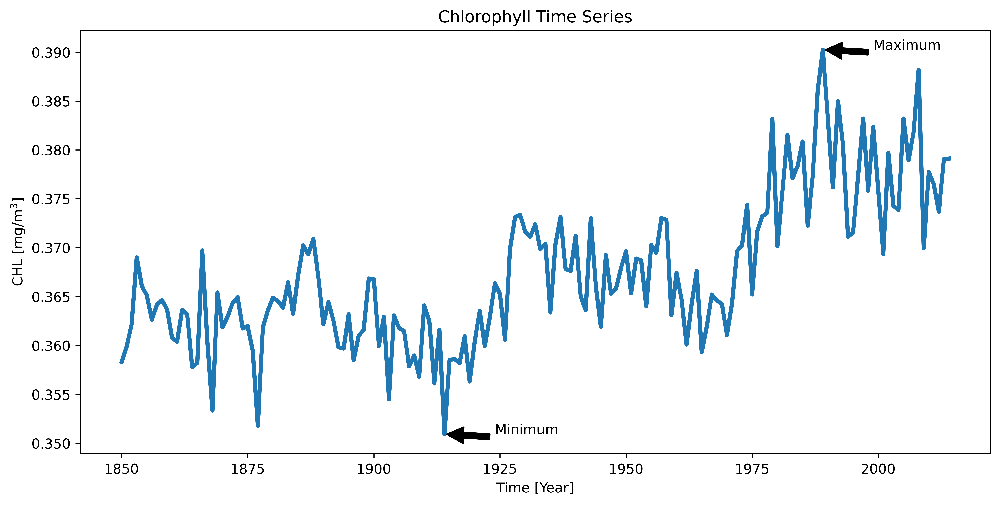

In [333]:
fig,axes = plt.subplots(1,1,figsize=(10,5),constrained_layout=True)

axes.plot(CHL_diversity.year.dt.year,CHL_diversity.mean("model_name"),
          linewidth=3,color='tab:blue',label='MME')

axes.annotate('Maximum', xy=(CHL_diversity.year.dt.year[ind_max_CHL],
                             CHL_diversity.mean("model_name")[ind_max_CHL]),
                         xytext=(CHL_diversity.year.dt.year[ind_max_CHL]+10,
                             CHL_diversity.mean("model_name")[ind_max_CHL]),
             arrowprops=dict(facecolor='black', shrink=0.05),
             )

axes.annotate('Minimum', xy=(CHL_diversity.year.dt.year[ind_min_CHL],
                             CHL_diversity.mean("model_name")[ind_min_CHL]),
                         xytext=(CHL_diversity.year.dt.year[ind_min_CHL]+10,
                             CHL_diversity.mean("model_name")[ind_min_CHL]),
             arrowprops=dict(facecolor='black', shrink=0.05),
             )
axes.set_xlabel("Time [Year]")
axes.set_ylabel("CHL [mg/m$^3$]")
axes.set_title("Chlorophyll Time Series")

<ipython-input-350-c7d9e1acea95>:19: UserWarning: Data has no values between 0 and 1, and therefore cannot be logit-scaled.
  axes[1][1].set_yscale("logit")


Text(0.5, 1.0, 'Logit')

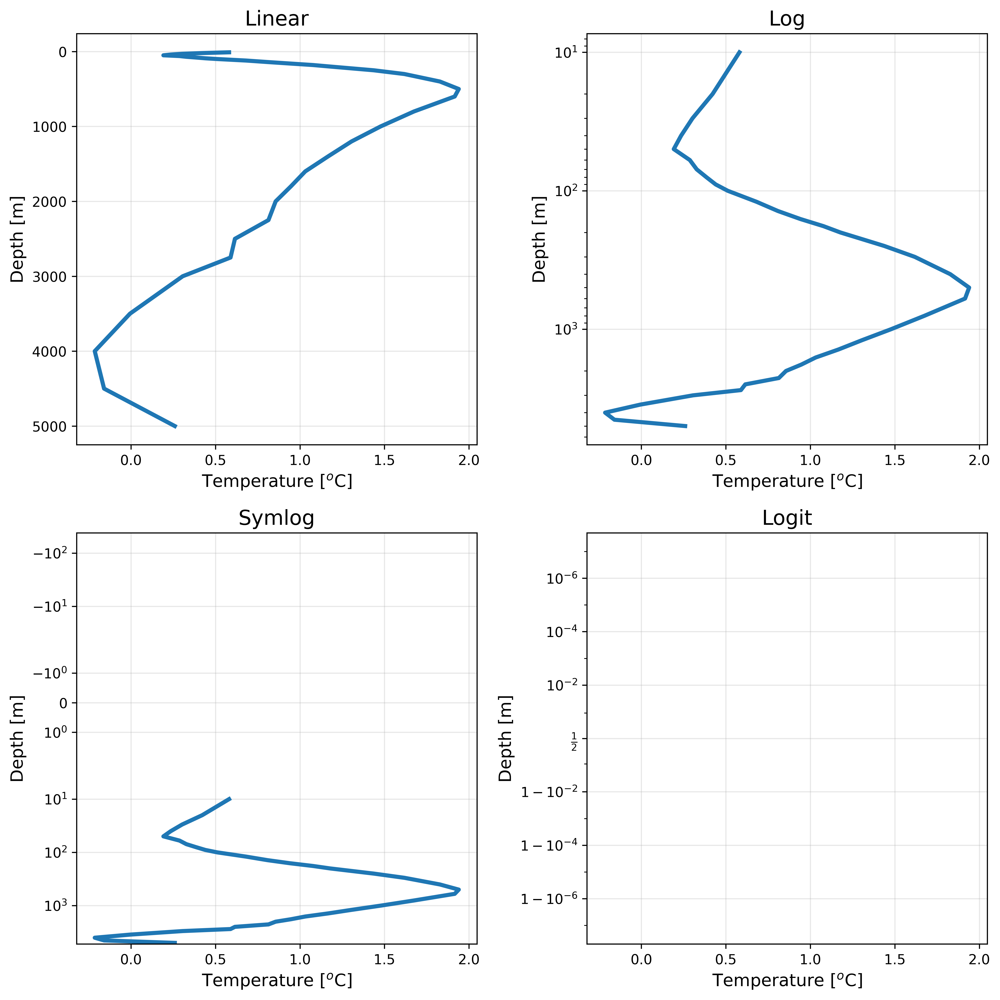

In [350]:
fig,axes = plt.subplots(2,2,figsize=(10,10),constrained_layout=True)

temp_z_MME = temp_MME.weighted(weights_lat).mean(("year","lat","lon"))

for i in range(2):
    for j in range(2):
        axes[i][j].plot(temp_z_MME,temp_MME.lev,linewidth=3)
        axes[i][j].invert_yaxis()
        axes[i][j].set_xlabel("Temperature [$^o$C]",fontsize=12.5)
        axes[i][j].set_ylabel("Depth [m]",fontsize=12.5)
        axes[i][j].grid(alpha=0.3)
        
axes[0][0].set_yscale("linear")
axes[0][0].set_title("Linear",fontsize=15)
axes[0][1].set_yscale("log")
axes[0][1].set_title("Log",fontsize=15)
axes[1][0].set_yscale("symlog")
axes[1][0].set_title("Symlog",fontsize=15)
axes[1][1].set_yscale("logit")
axes[1][1].set_title("Logit",fontsize=15)


## 1.Marginal Plot

Text(112.91666666666667, 0.5, 'NO3 [mmol/m$^3$]')

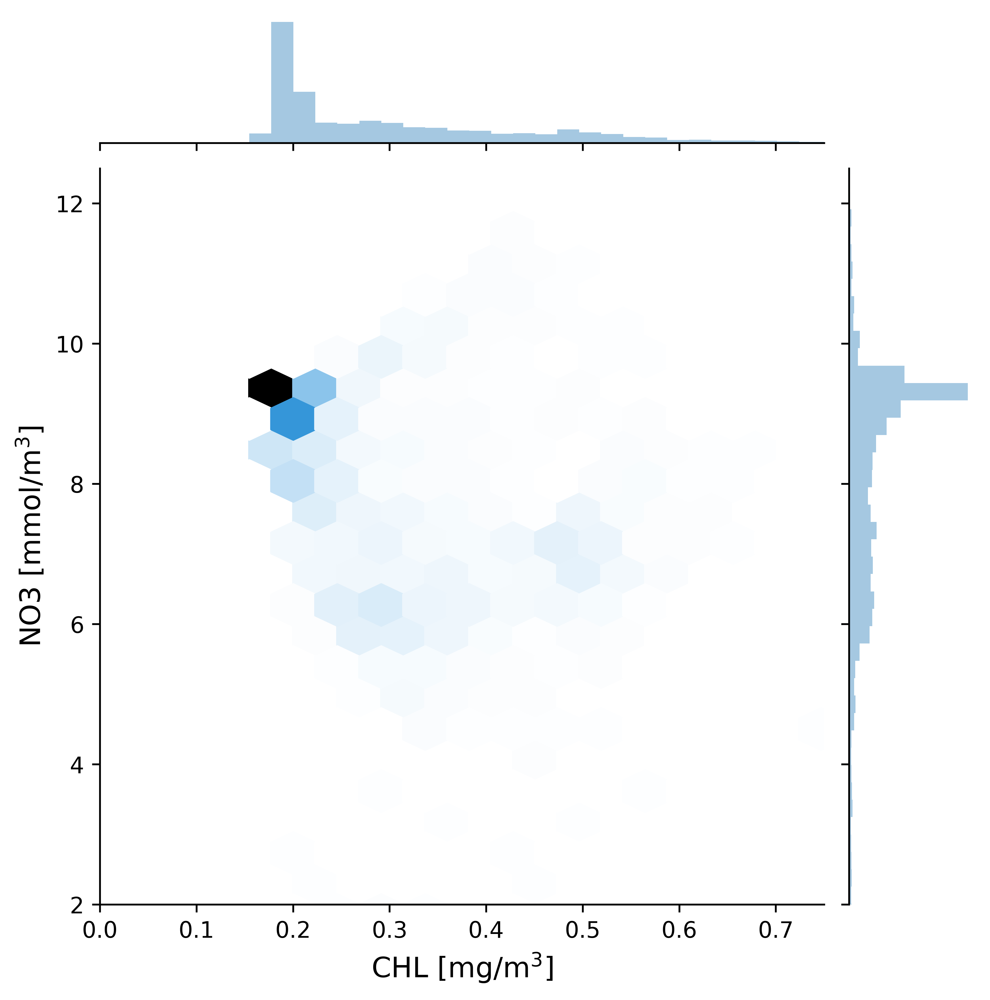

In [58]:
h = sns.jointplot(x=CHL_1D[ind_nnan], y=NO3_1D[ind_nnan],
              kind='hex', marginal_kws=dict(bins=100))

h.ax_marg_x.set_xlim(0, 0.75)
h.ax_marg_y.set_ylim(2, 12.5)

h.ax_joint.set_xlabel("CHL [mg/m$^3$]",fontsize=12.5)
h.ax_joint.set_ylabel("NO3 [mmol/m$^3$]",fontsize=12.5)

## 2.Central Plot

Text(112.91666666666667, 0.5, 'NO3 [mmol/m$^3$]')

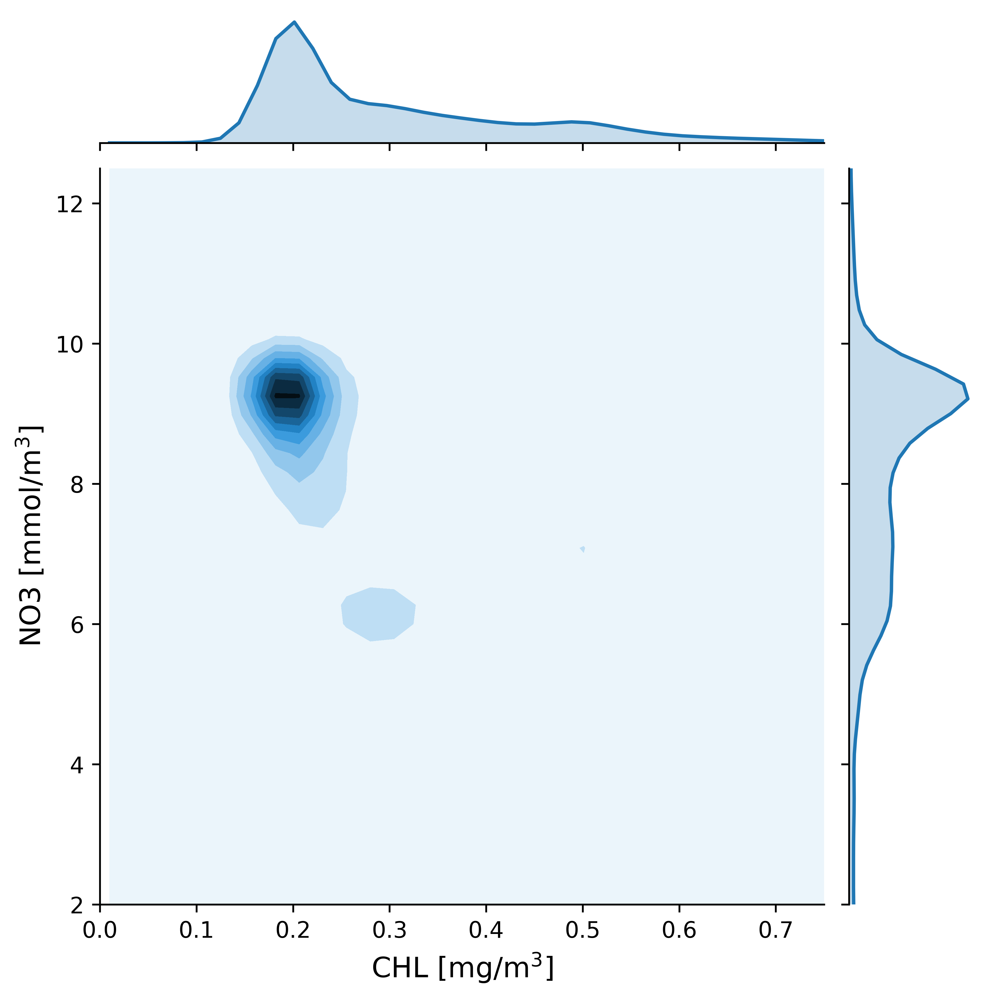

In [59]:
h = sns.jointplot(x=CHL_1D[ind_nnan], y=NO3_1D[ind_nnan],
              kind='kde')

h.ax_marg_x.set_xlim(0, 0.75)
h.ax_marg_y.set_ylim(2, 12.5)

h.ax_joint.set_xlabel("CHL [mg/m$^3$]",fontsize=12.5)
h.ax_joint.set_ylabel("NO3 [mmol/m$^3$]",fontsize=12.5)

## 3.Bubble chart

Text(0.5, 1.0, 'CMIP6 Historical')

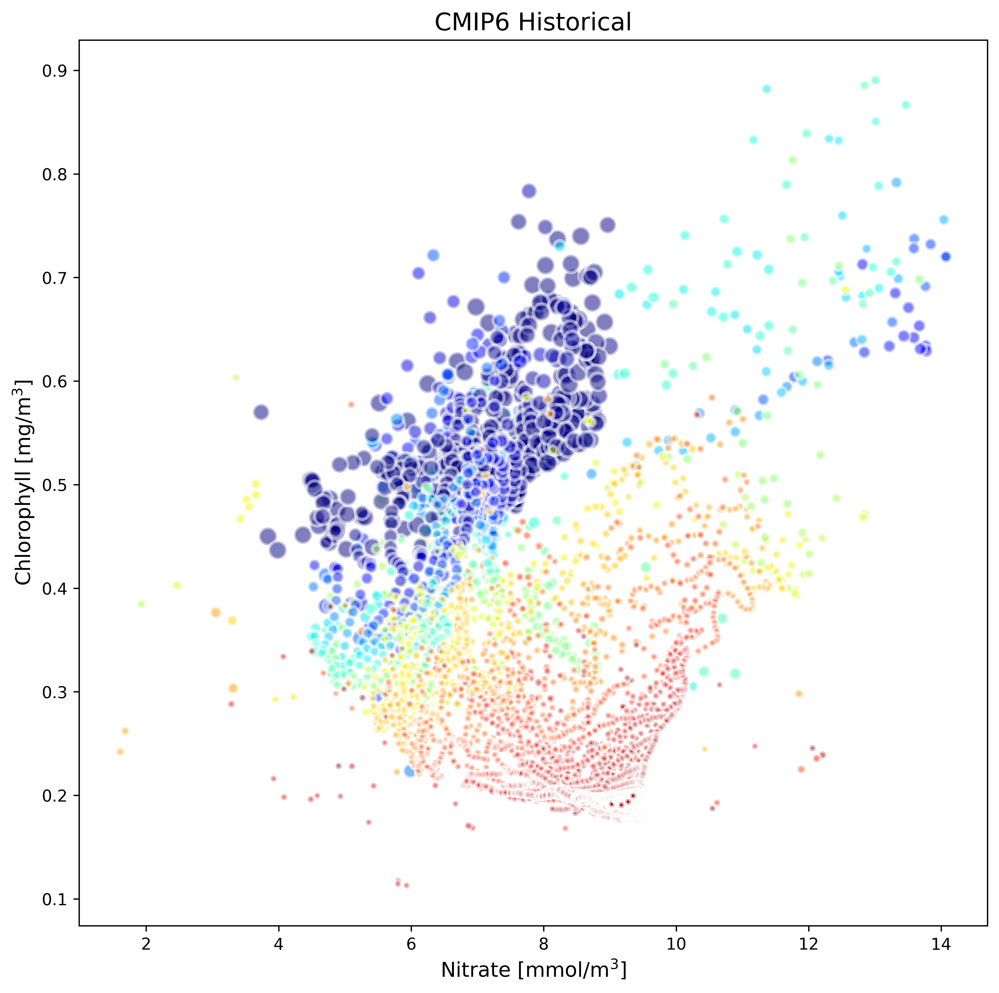

In [125]:
plt.figure(figsize=(10, 10))

# Scatterplot
plt.scatter(
    x = NO3_1D, 
    y = CHL_1D, 
    s = (temp_1D+3)*10, 
    c = SIC_1D, 
    cmap="jet", 
    alpha=0.5, 
    edgecolors="white", 
    linewidth=2);

# plt.xscale('log')
plt.xlabel("Nitrate [mmol/m$^3$]",fontsize=12.5)
plt.ylabel("Chlorophyll [mg/m$^3$]",fontsize=12.5)
plt.title("CMIP6 Historical",fontsize=15)

## 4. Basic violinplots

Text(0, 0.5, 'SIC [%]')

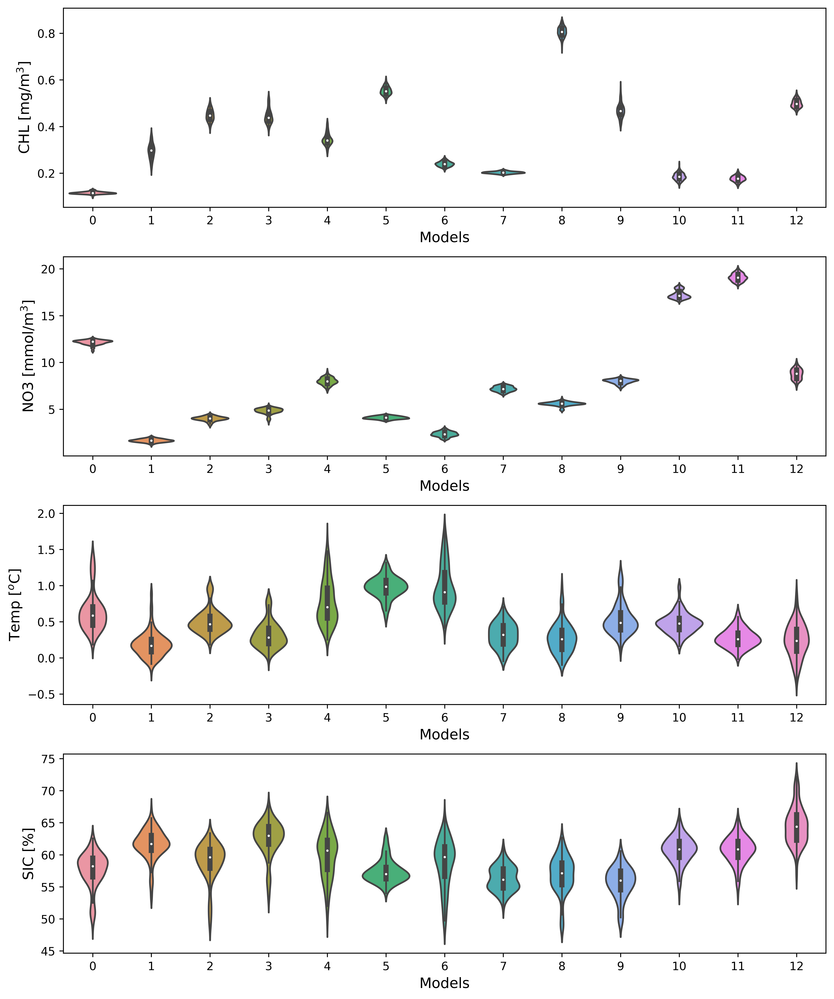

In [194]:
fig,axes = plt.subplots(4,1,figsize=(10,12),constrained_layout=True)

h = sns.violinplot(ax=axes[0],data=CHL_diversity.T)

h.set_xlabel("Models",fontsize=12.5)
h.set_ylabel("CHL [mg/m$^3$]",fontsize=12.5)

h = sns.violinplot(ax=axes[1],data=NO3_diversity.T)

h.set_xlabel("Models",fontsize=12.5)
h.set_ylabel("NO3 [mmol/m$^3$]",fontsize=12.5)

h = sns.violinplot(ax=axes[2],data=temp_diversity[:,:,0].T)

h.set_xlabel("Models",fontsize=12.5)
h.set_ylabel("Temp [$^o$C]",fontsize=12.5)

h = sns.violinplot(ax=axes[3],data=SIC_diversity.T)

h.set_xlabel("Models",fontsize=12.5)
h.set_ylabel("SIC [%]",fontsize=12.5)


## 5. Circular bar plot

In [376]:
plt.figure(figsize=(20,10))
ax = plt.subplot(111,polar=True)

data = CHL_diversity.mean("year")

# remove grid
plt.axis('off')

# Set the coordinates limits
upperLimit = 200
lowerLimit = 30

# Compute max and min in the dataset
max = data.max()

# Let's compute heights: they are a conversion of each item value in those new coordinates
# In our example, 0 in the dataset will be converted to the lowerLimit (10)
# The maximum will be converted to the upperLimit (100)
slope = (max - lowerLimit) / max
heights = slope * data + lowerLimit

# Compute the width of each bar. In total we have 2*Pi = 360°
width = 2*np.pi / len(data)

# Compute the angle each bar is centered on:
indexes = list(range(1, len(data)+1))
angles = [element * width for element in indexes]
angles

# Draw bars
bars = ax.bar(
    x=angles, 
    height=heights, 
    width=width, 
    bottom=lowerLimit,
    linewidth=2, 
    edgecolor="white")

labelPadding = 4

# Add labels
for bar, angle, height, label in zip(bars,angles, heights, CHL_diversity.model_name.values):

    # Labels are rotated. Rotation must be specified in degrees :(
    rotation = np.rad2deg(angle)

    # Flip some labels upside down
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else: 
        alignment = "left"

    # Finally add the labels
    ax.text(
        x=angle, 
        y=lowerLimit + bar.get_height() + labelPadding, 
        s=label, 
        ha=alignment, 
        va='center', 
        rotation=rotation, 
        rotation_mode="anchor")
# fig.show()

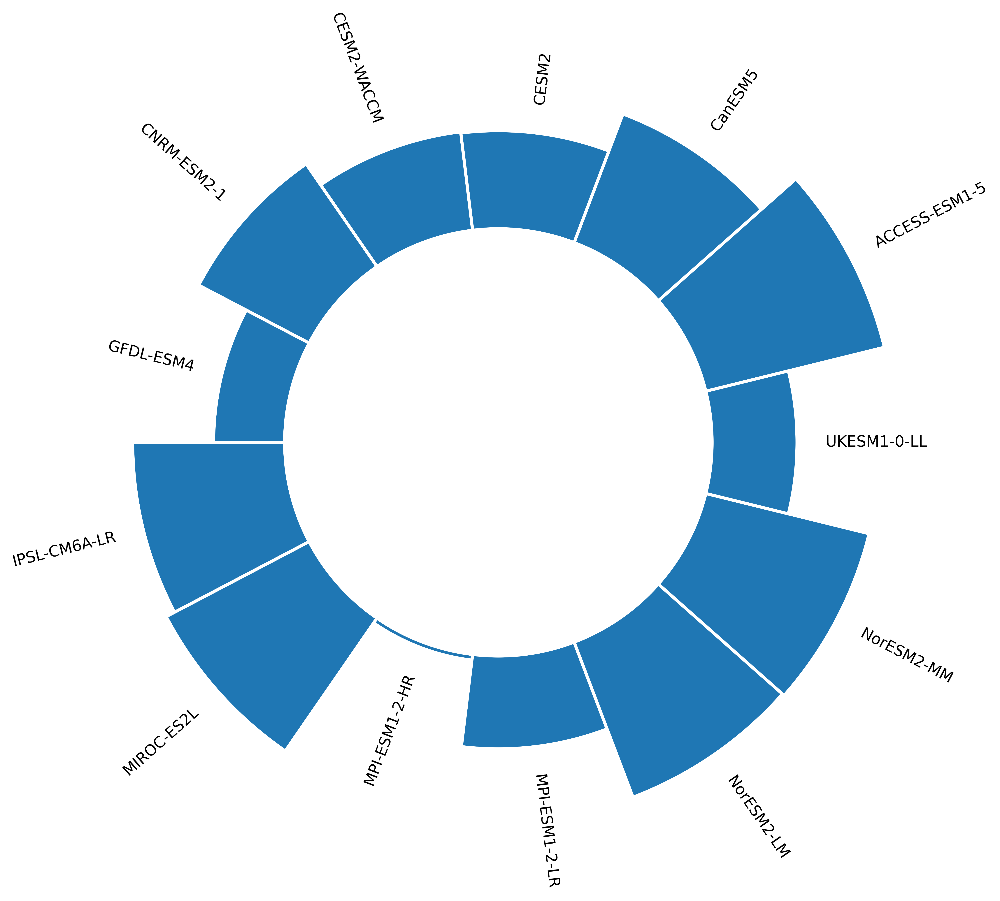

In [377]:
plt.plot(1,1)